In [91]:
# Data: https://humansintheloop.org/resources/datasets/car-parts-and-car-damages-dataset/

# Data sets with car damages:
# HITL: human in the loop (data set)
# COCO: small data set in coco format

# No custom data augmentation is defined

In [9]:
%matplotlib inline
from pycocotools.coco import COCO
#import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt
#import pylab
#import random
#pylab.rcParams['figure.figsize'] = (8.0, 10.0)# Import Libraries

import datetime
# For visualization
import os
#import seaborn as sns
from matplotlib import colors
from tensorboard.backend.event_processing import event_accumulator as ea
#from PIL import Image


%matplotlib inline

#### Load data (Humans in the loop data)

In [1]:
_ = """
import json

with open("data/humansintheloop/Carpartsdataset/File1/train/coco_annotations_damage.json", "r") as file:
    data_train_hitl = json.load(file)

with open("data/humansintheloop/Carpartsdataset/File1/val/coco_annotations_damage.json", "r") as file:
    data_val_hitl = json.load(file)
"""

In [7]:
_ = """
(
    len([i["id"] for i in data_train_hitl["images"]]), len([i["file_name"] for i in data_train_hitl["images"]]),
len([i["id"] for i in data_val_hitl["images"]]), len([i["file_name"] for i in data_val_hitl["images"]])
)
"""

In [17]:
# initialize data paths
dataset_dir_coco = "data/coco/"
dataset_dir_hitl = "data/humansintheloop/Carpartsdataset/File1/"

img_dir = "img/"
train_dir = "train/"
val_dir = "val/"
test_dir = "test/"
test_dir = os.path.join(dataset_dir_coco, test_dir)  # use test images from coco data set

img_dir_coco = os.path.join(dataset_dir_coco, img_dir)
img_dir_hitl = os.path.join(dataset_dir_hitl, img_dir)

# single class annotations: damage
ann_train_hitl = os.path.join(dataset_dir_hitl, train_dir, "coco_annotations_damage.json")
ann_val_hitl = os.path.join(dataset_dir_hitl, val_dir, "coco_annotations_damage.json")

ann_train_coco = os.path.join(dataset_dir_coco, train_dir, "COCO_train_annos.json")
ann_val_coco = os.path.join(dataset_dir_coco, val_dir, "COCO_val_annos.json")

In [18]:
# initialize coco api for instance annotations
coco_coco = COCO(ann_train_coco)
coco_hitl = COCO(ann_train_hitl)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


In [19]:
# display categories from both data sets
cats_coco = coco_coco.loadCats(coco_coco.getCatIds())
cats_hitl = coco_hitl.loadCats(coco_hitl.getCatIds())
nms_coco = [cat['name'] for cat in cats_coco]
nms_hitl = [cat['name'] for cat in cats_hitl]
print('COCO categories for damages (COCO): \n{}\n'.format(', '.join(nms_coco)))
print('COCO categories for damages (HITL): \n{}\n'.format(', '.join(nms_hitl)))

COCO categories for damages (COCO): 
damage

COCO categories for damages (HITL): 
damage



# Model

In [9]:
# install detectron2
#!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

In [10]:
#!python -m pip install opencv-python
#!python -m pip install torch torchvision torchaudio

In [16]:
import detectron2
from detectron2.utils.logger import setup_logger

import torch, torchvision
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print(torch.__version__, torch.cuda.is_available())
print("detectron2:", detectron2.__version__)

1.13.1+cpu False
detectron2: 0.6


'nvcc' is not recognized as an internal or external command,
operable program or batch file.


In [24]:
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
import matplotlib.pyplot as plt
import skimage.io as io

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances

from detectron2.engine import DefaultTrainer
from detectron2.utils.visualizer import ColorMode
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Set base params
plt.rcParams["figure.figsize"] = [16,9]

In [22]:
# coco
register_coco_instances("car_dataset_coco_train", {}, ann_train_coco, image_root=img_dir_coco)
register_coco_instances("car_dataset_coco_val", {}, ann_val_coco, image_root=img_dir_coco)

# hitl
register_coco_instances("car_dataset_hitl_train", {}, ann_train_hitl, image_root=img_dir_hitl)
register_coco_instances("car_dataset_hitl_val", {}, ann_val_hitl, image_root=img_dir_hitl)

In [25]:
dataset_dicts_coco = DatasetCatalog.get("car_dataset_coco_train")
metadata_dicts_coco = MetadataCatalog.get("car_dataset_coco_train")

dataset_dicts_hitl = DatasetCatalog.get("car_dataset_hitl_train")
metadata_dicts_hitl = MetadataCatalog.get("car_dataset_hitl_train")

[03/07 12:54:13 d2.data.datasets.coco]: Loaded 59 images in COCO format from data/coco/train/COCO_train_annos.json
[03/07 12:54:13 d2.data.datasets.coco]: Loaded 671 images in COCO format from data/humansintheloop/Carpartsdataset/File1/train/coco_annotations_damage.json


In [16]:
#[i for i in dataset_dicts if i['file_name']=='data/humansintheloop/Carpartsdataset/File1/img/Car damages 1069.png']

data/coco/img/56.jpg


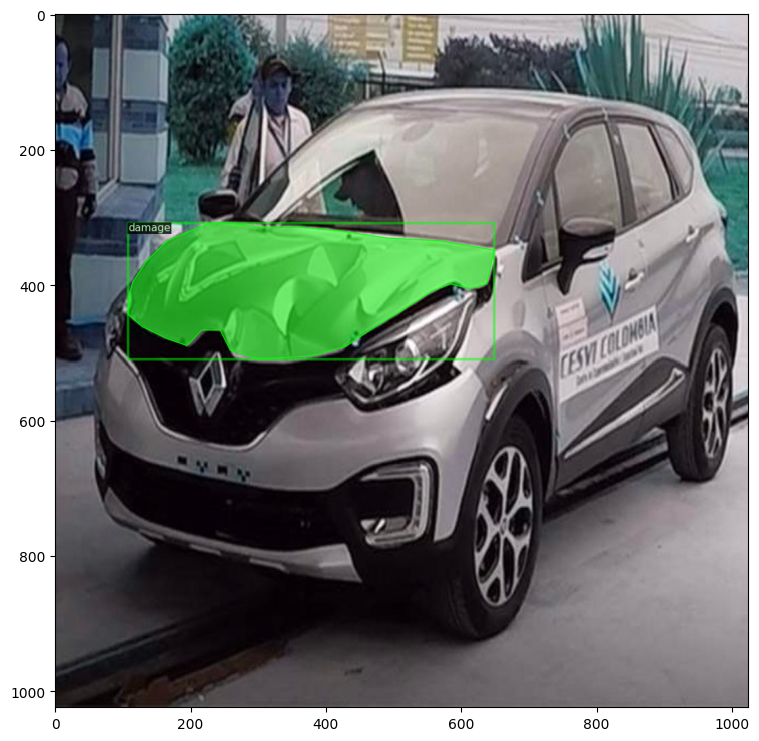

data/coco/img/75.jpg


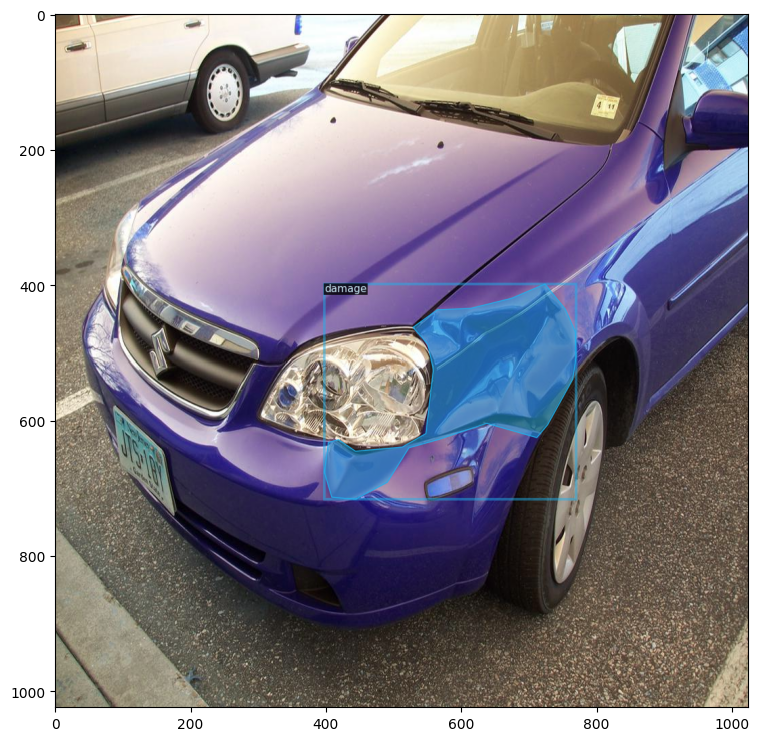

data/humansintheloop/Carpartsdataset/File1/img/Car damages 1172.png


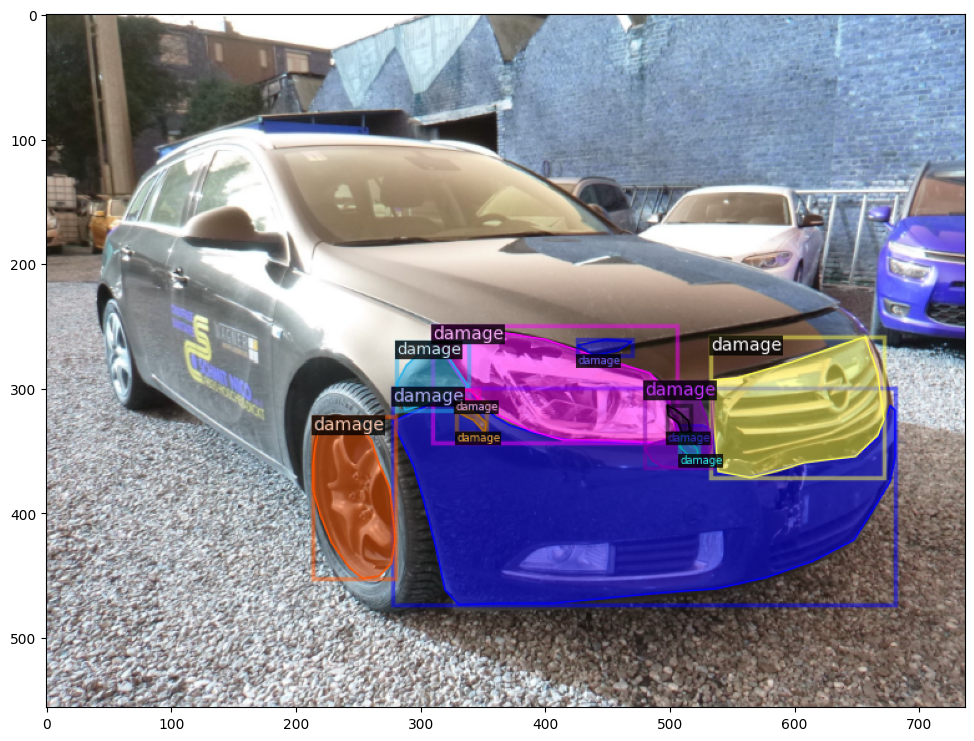

data/humansintheloop/Carpartsdataset/File1/img/Car damages 1196.png


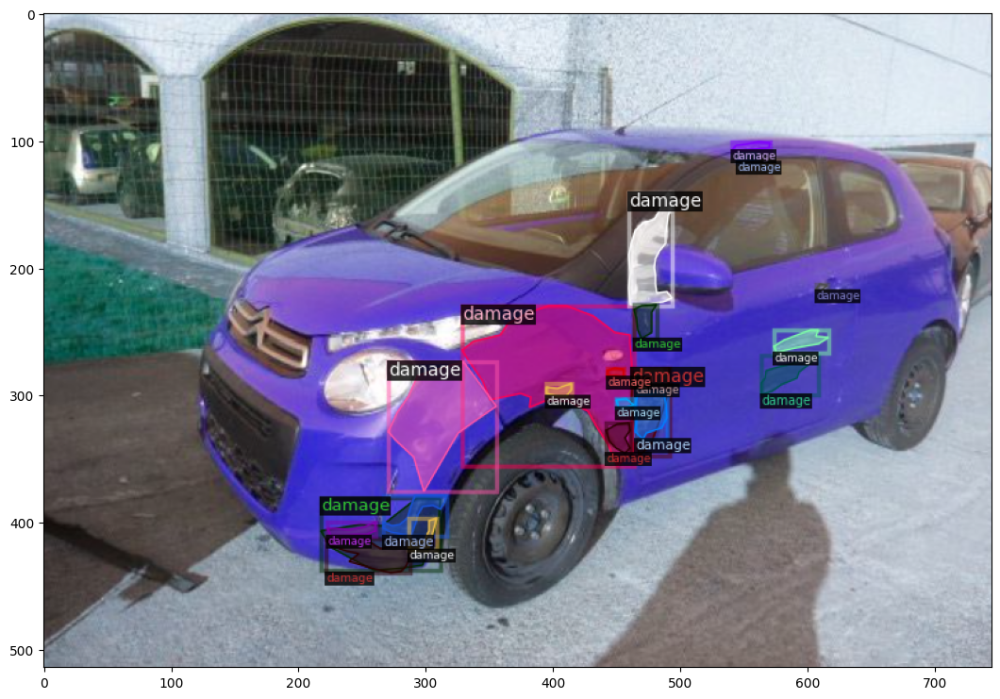

In [33]:
#from cv2 import imshow
# To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:
dd = random.sample(dataset_dicts_coco, 2) + random.sample(dataset_dicts_hitl, 2)
for d in dd:
    #print(d)
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata_dicts_hitl, scale=1)  # pass any metadata (to draw class names and colours)
    out = visualizer.draw_dataset_dict(d)
    #imshow("a", out.get_image()[:, :, ::-1])
    print(d["file_name"])
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

## Train

In [61]:
cfg.OUTPUT_DIR
f"{cfg.OUTPUT_DIR}/mycfg.yaml"

'./output/output_20240307_155051/mycfg.yaml'

In [60]:
cfg = get_cfg()
cfg.OUTPUT_DIR = f"./output/output_{datetime.datetime.now().strftime('%Y%m%d_%T').replace(':', '')}"

# Load custom config

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file("./output/output_20240307_152516/mycfg.yaml")  # to continue training on new data set

cfg.DATASETS.TRAIN = ("car_dataset_coco_train", "car_dataset_hitl_train")
cfg.DATASETS.TEST = ("car_dataset_coco_val", "car_dataset_hitl_val")
cfg.DATALOADER.NUM_WORKERS = 4

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
#cfg.MODEL.WEIGHTS = os.path.join("./output/output_20240307_145108/", "model_final.pth")  # path to the model we just trained (to continue training on new data set)

cfg.MODEL.DEVICE='cpu'

cfg.SOLVER.IMS_PER_BATCH = 2  # 2,4    This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500  # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []  # do not decay learning rate

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 8   # images used to calculate cls and reg loss during training. 128 is faster, and good enough for this  dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (damage)


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# save config
with open(f"{cfg.OUTPUT_DIR}/mycfg.yaml", "w") as f: 
    f.write(cfg.dump())

In [90]:
cfg["INPUT"]

CfgNode({'MIN_SIZE_TRAIN': (640, 672, 704, 736, 768, 800), 'MIN_SIZE_TRAIN_SAMPLING': 'choice', 'MAX_SIZE_TRAIN': 1333, 'MIN_SIZE_TEST': 800, 'MAX_SIZE_TEST': 1333, 'RANDOM_FLIP': 'horizontal', 'CROP': CfgNode({'ENABLED': False, 'TYPE': 'relative_range', 'SIZE': [0.9, 0.9]}), 'FORMAT': 'BGR', 'MASK_FORMAT': 'polygon'})

In [62]:
# Add validation metrics to the tensorboard: https://github.com/ravijo/detectron2_tutorial/blob/main/main.py

from tfboard_validation.trainer import Trainer
from tfboard_validation.val_loss_hook import ValLossHook
from detectron2.engine import hooks


trainer = Trainer(cfg)

# creates a hook that after each iter calculates the validation loss on the next batch
# Register the hoooks
trainer.register_hooks([ValLossHook(cfg)])

# The PeriodicWriter needs to be the last hook, otherwise it wont have access to valloss metrics
# Ensure PeriodicWriter is the last called hook
periodic_writer_hook = [hook for hook in trainer._hooks if isinstance(hook, hooks.PeriodicWriter)]
all_other_hooks = [hook for hook in trainer._hooks if not isinstance(hook, hooks.PeriodicWriter)]
trainer._hooks = all_other_hooks + periodic_writer_hook6


trainer.resume_or_load(resume=False)

# will throw error at the end (during the final evaluation). This is fine since I need to add "area" attribute into the annotations
trainer.train()

[03/07 15:51:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[03/07 15:51:27 d2.engine.train_loop]: Starting training from iteration 0
[03/07 15:55:50 d2.utils.events]:  eta: 1:24:21  iter: 19  total_loss: 5.653  loss_cls: 0.7685  loss_box_reg: 0.5795  loss_mask: 0.6931  loss_rpn_cls: 3.453  loss_rpn_loc: 0.3065  val_total_loss: 5.687  val_loss_cls: 0.7695  val_loss_box_reg: 0.5052  val_loss_mask: 0.6919  val_loss_rpn_cls: 3.546  val_loss_rpn_loc: 0.3545    time: 10.4690  last_time: 10.7997  data_time: 0.2535  last_data_time: 0.0023   lr: 9.7405e-06  
[03/07 15:59:58 d2.utils.events]:  eta: 1:19:47  iter: 39  total_loss: 3.348  loss_cls: 0.7271  loss_box_reg: 0.4469  loss_mask: 0.6899  loss_rpn_cls: 1.214  loss_rpn_loc: 0.2473  val_total_loss: 5.164  val_loss_cls: 0.6982  val_loss_box_reg: 0.3199  val_loss_mask: 0.6895  val_loss_rpn_cls: 2.596  val_loss_rpn_loc: 0.4695    time: 10.2993  last_time: 10.5393  data_time: 0.0018  last_data_time: 0.0021   lr: 1.9731e-05  
[03/07 16:04:13 d2.utils.events]:  eta: 1:17:08  iter: 59  total_loss: 2.351  lo

KeyError: 'area'

In [64]:
# Look at training curves in tensorboard:
#tensorboard --logdir output
#%load_ext tensorboard
#%tensorboard --logdir output

# Inference & evaluation using the trained model

Let's run inference with the trained model on the validation dataset. First, let's create a predictor using the model we just trained:

In [70]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/11 11:11:21 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/output_20240307_155051\model_final.pth ...


#### Then, we randomly select several samples to visualize the prediction results on validation data

In [66]:
dataset_dicts_coco_val = DatasetCatalog.get("car_dataset_coco_val")
metadata_dicts_coco_val = MetadataCatalog.get("car_dataset_coco_val")

dataset_dicts_hitl_val = DatasetCatalog.get("car_dataset_hitl_val")
metadata_dicts_hitl_val = MetadataCatalog.get("car_dataset_hitl_val")

[03/11 11:07:16 d2.data.datasets.coco]: Loaded 11 images in COCO format from data/coco/val/COCO_val_annos.json
[03/11 11:07:16 d2.data.datasets.coco]: Loaded 143 images in COCO format from data/humansintheloop/Carpartsdataset/File1/val/coco_annotations_damage.json


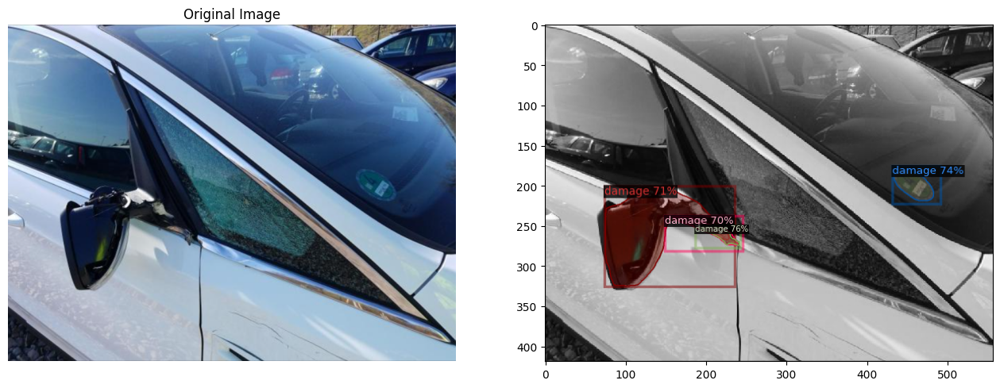

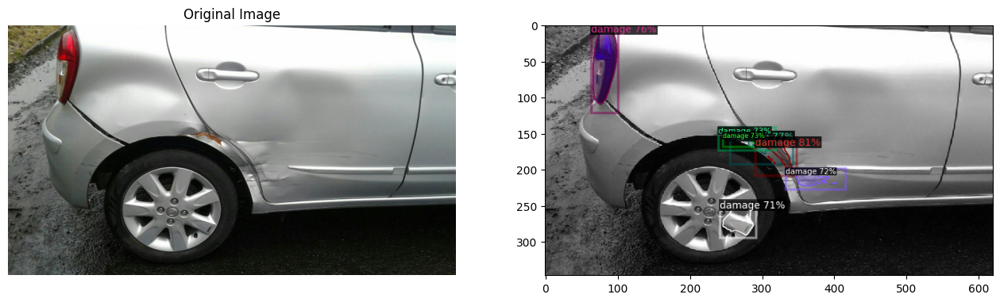

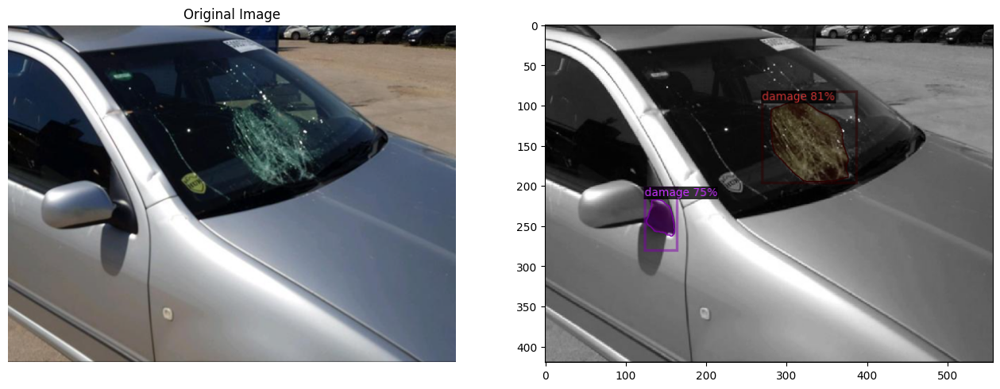

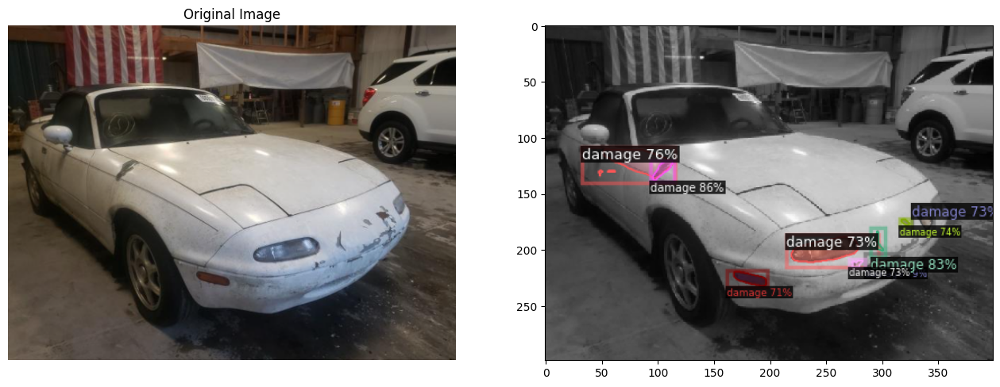

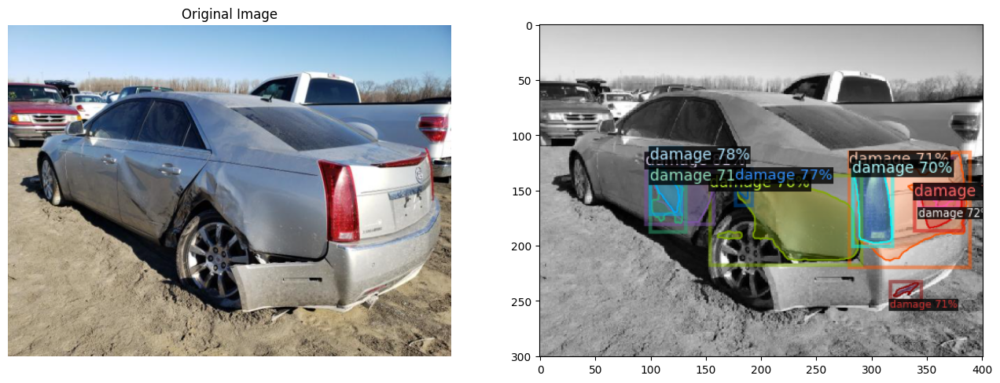

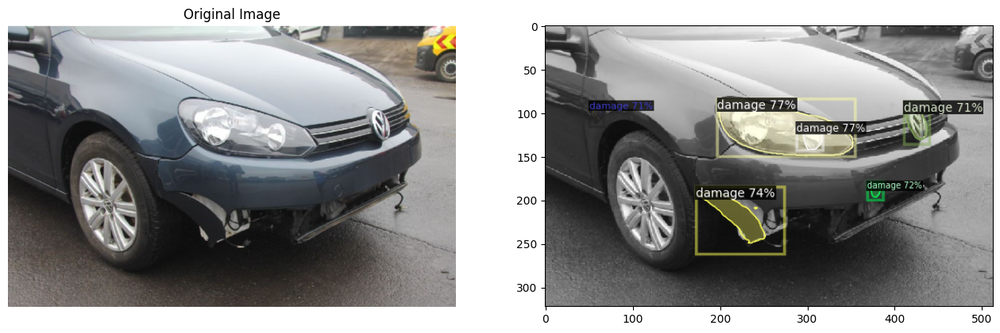

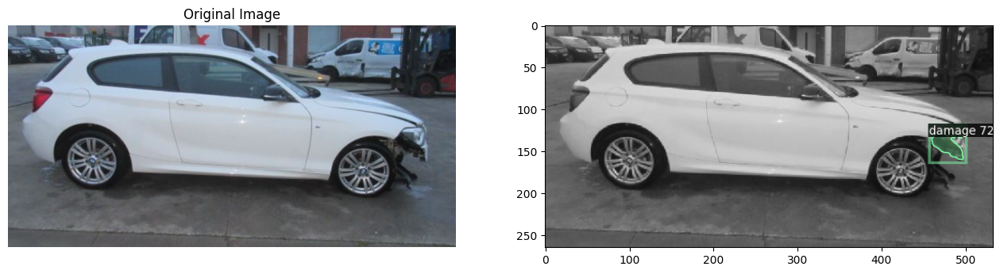

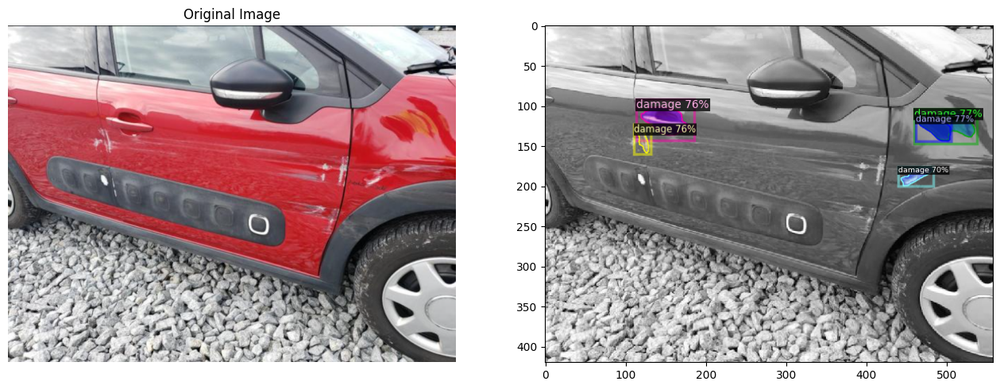

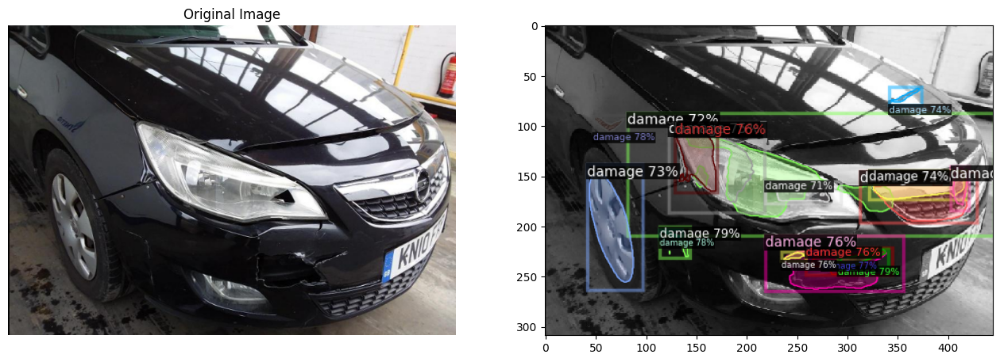

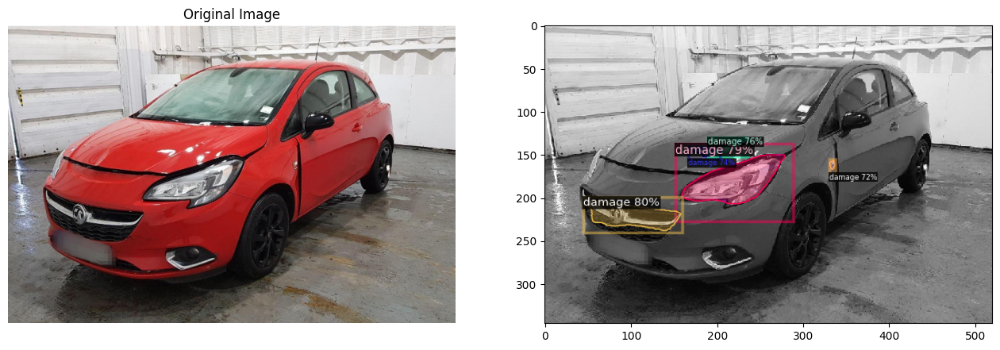

In [80]:
from detectron2.utils.visualizer import ColorMode
#dataset_dicts = get_balloon_dicts("balloon/val")
for d in random.sample(dataset_dicts_hitl_val, 10):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format

    # Visualize original image
    plt.subplot(1, 2, 1)
    plt.imshow(im[:, :, ::-1])
    plt.title('Original Image')
    plt.axis('off')
    
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata_dicts_hitl_val, 
                   scale=0.7, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.subplot(1, 2, 2)
    #cv2_imshow(out.get_image()[:, :, ::-1])
    #plt.imshow(im)
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.show()

In [81]:
f'{test_dir}*.jpg'

'data/coco/test/*.jpg'

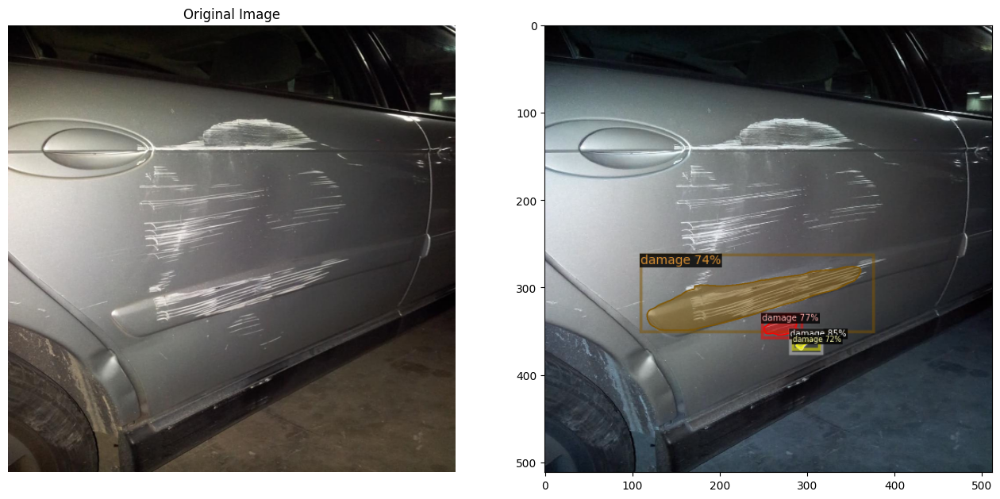

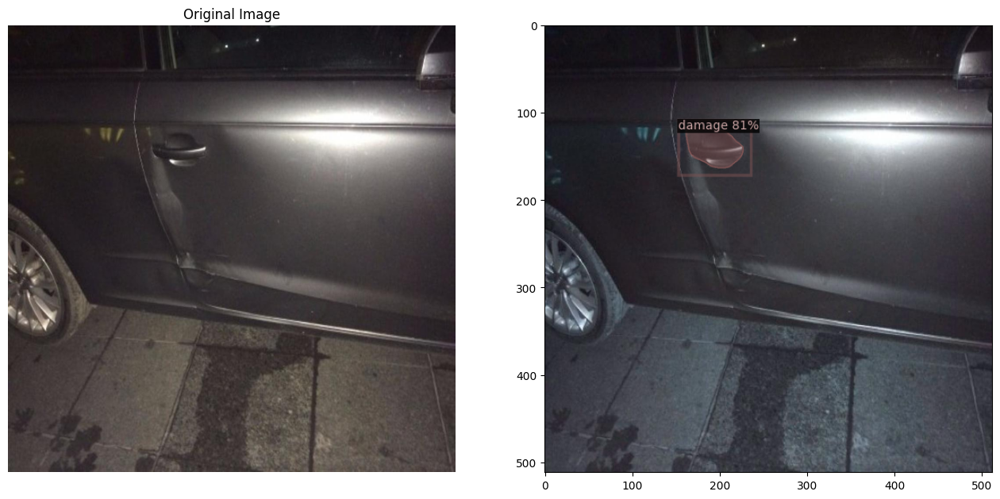

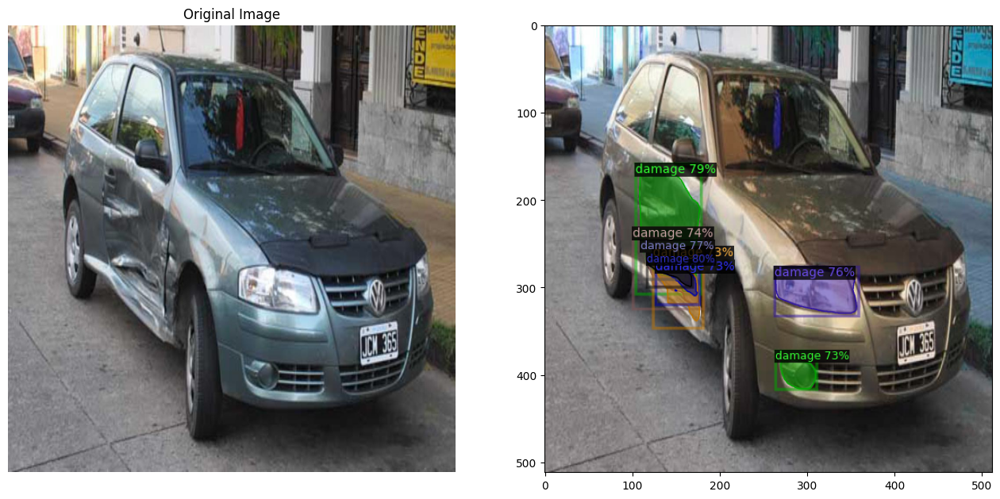

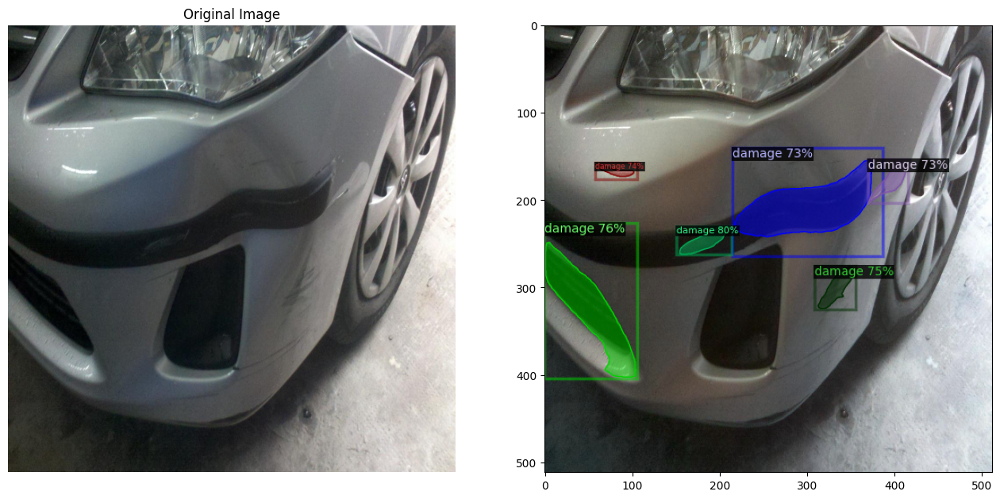

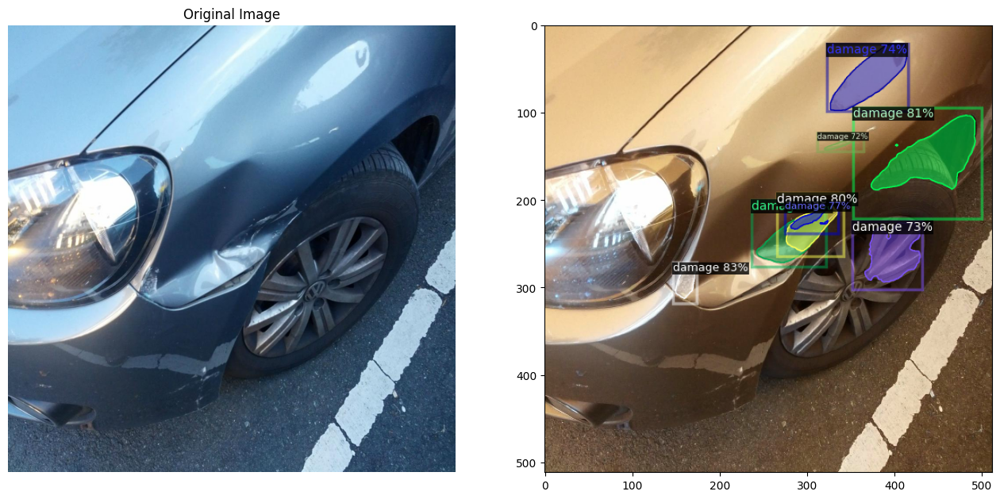

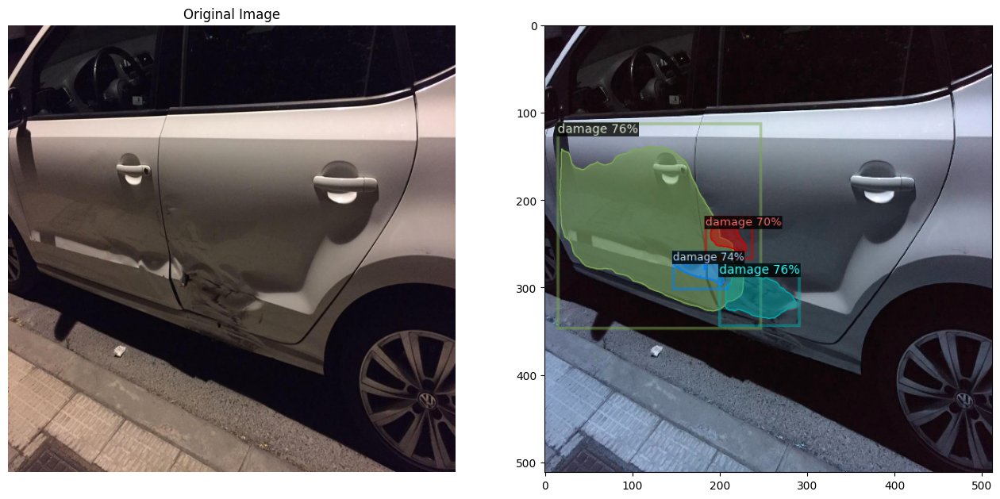

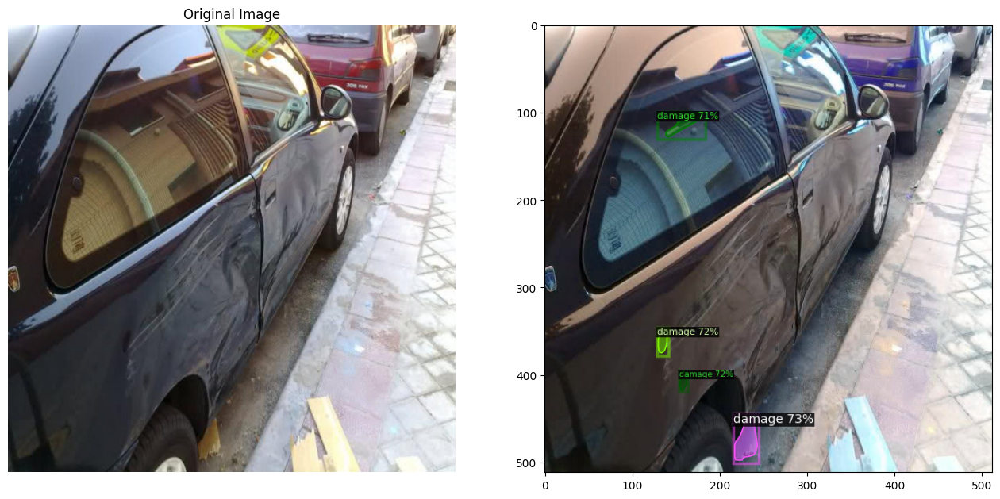

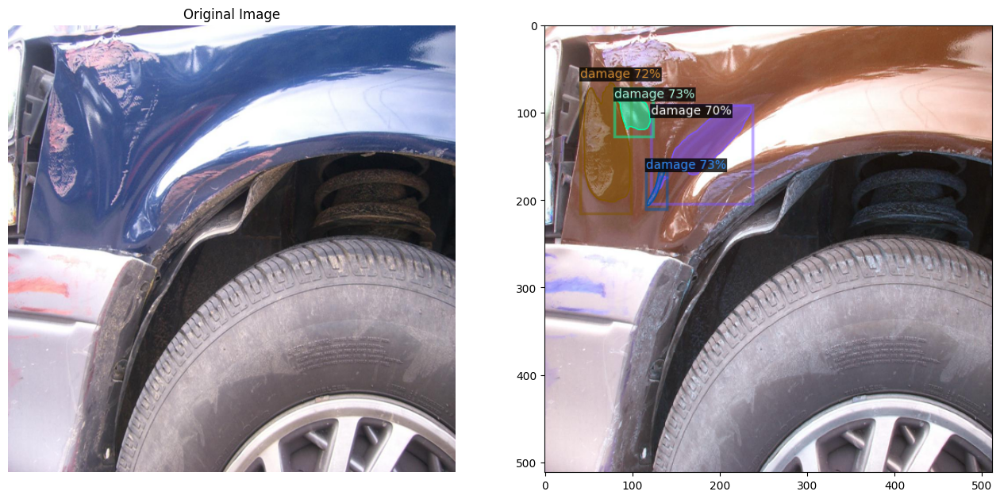

In [84]:
# Check the model on test data

import glob

for img in glob.glob(f'{test_dir}*.jpg'):
  im = cv2.imread(img)
  #print(im)
  output = predictor(im)
  # Visualize original image
  plt.subplot(1, 2, 1)
  plt.imshow(im[:, :, ::-1])
  plt.title('Original Image')
  plt.axis('off')

  # We can use `Visualizer` to draw the predictions on the test images
  v = Visualizer(im[:, :, ::-1], metadata_dicts_coco, scale=0.5)
  out = v.draw_instance_predictions(output["instances"].to("cpu"))
  #cv2_imshow(out.get_image()[:, :, ::-1])
  plt.subplot(1, 2, 2)
  plt.imshow(out.get_image()[:, :, ::-1])
  plt.show()

#### We can also evaluate its performance using AP metric implemented in COCO API. This gives an AP of ~5.

In [87]:
# Will fail, as there is no "area" in annotations
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("car_dataset_coco_val", output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "car_dataset_coco_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[03/11 11:27:26 d2.data.datasets.coco]: Loaded 11 images in COCO format from data/coco/val/COCO_val_annos.json
[03/11 11:27:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/11 11:27:26 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/11 11:27:26 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[03/11 11:27:26 d2.data.common]: Serialized dataset takes 0.01 MiB
[03/11 11:27:26 d2.evaluation.evaluator]: Start inference on 11 batches
[03/11 11:27:54 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0004 s/iter. Inference: 2.0094 s/iter. Eval: 0.0172 s/iter. Total: 2.0270 s/iter. ETA=0:00:00
[03/11 11:27:54 d2.evaluation.evaluator]: Total inference time: 0:00:12.452315 (2.075386 s / iter per device, on 1 devices)
[03/11 11:27:54 d2.evaluation.evaluator]: Total infe